<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Capstone Project - Zoom Ally: A Running Form Classifier (Overstriding)

> Author: Lee Hongwei
---

## Problem Statement:

Our challenge is to devise a solution that empowers individuals to **detect one of the most prevalent running form errors: overstriding**, attempting to strengthen Nike Run Club's position as a trusted virtual running coach and in turn, the app's ability to attract and retain users.

---
There are a total of ___ notebooks for this project:  
 1. `01_Data_Collection_Video_Dl.ipynb`   
 2. `02_Data_Collection_Pose_Estimation.ipynb`   
 3. `03_Feature_Engineering_and_EDA.ipynb`
 4. `04_Data_Preprocessing_and_Modelling.ipynb`

**This Notebook**
- Perform analysis and comparison of overstride and no_overstride running videos

# 1. Import Libraries

In [1]:
import math
import cv2
import numpy as np
from time import time
import mediapipe as mp
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# 2. Pose Detection and Other Functions

## 2.1 Pose Detection Models and Functions

- In this notebook, we will be using the similar models and functions from notebook 02. 
- A key difference is that we're setting detection and tracking confidence of our mediapipe pose estimation model to 0.7, as we want our results to be more accurate in identifying nuanced differences.

In [2]:
# Initializing mediapipe pose class
mp_pose = mp.solutions.pose

# Setting up the Pose function
pose = mp_pose.Pose(min_detection_confidence=0.7, min_tracking_confidence=0.7)

# Initializing mediapipe drawing class for annotation
mp_drawing = mp.solutions.drawing_utils

I0000 00:00:1715262517.123315       1 gl_context.cc:344] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M2


In [3]:
def mediapipe_detection(image, model):
    # Colour conversion as opencv reads in bgr
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Make image non-writeable to prevent accidental modification of the image
    image.flags.writeable = False
    # Image data is fixed and can be used to create prediction results of keypoint detections
    results = model.process(image)
    # Make image writeable again
    image.flags.writeable = True
    # Convert colour back to bgr for it to be readable by opencv
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Return 2 values: image and results. 
    return image, results

def draw_landmarks(image, results):
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


<img src='https://i.imgur.com/3j8BPdc.png' style = 'height:300px'>

## 2.2 Calculate Angle Functions

### 2.2.1 Generic angle calculation

Joint angles are especially important in reviewing a runner's gait, some examples include knee, shank/shin, trunk lean and Hip extension angles. [(source)](https://compedgept.com/blog/running-form-overstride/)

In the case of overstriding, excessive knee extension is often observed which places a greater load through the knee joint and explains the occurence of knee injuries or pains amongst overstriders. [(source)](https://www.doctorsofrunning.com/2019/07/running-movement-impairments.html)

In [4]:
# angle of any 3 points

def calculate_angle(a, b, c):
    a = np.array(a) # FIRST
    b = np.array(b) # MID
    c = np.array(c) #END

    radians = np.arctan2(c[1]-b[1], c[0]-b[0]) - np.arctan2(a[1]-b[1], a[0]-b[0])
    angle = np.abs(radians*180.0/np.pi)

    if angle > 180.0:
        angle = 360-angle

    return angle

### 2.2.2 Shank (Shin) Angle Calculation

The shank angle can be a major indicator of whether a runner's foot is extending too far out at the point of initial contact (the moment the leading foot touches the ground). As seen below, a positive angle at initial contact is often observed with overstriders, whereas running experts recommend the shank to be perpendicular to the ground at initial contact [(source)](https://compedgept.com/blog/running-form-overstride/)


<img src='https://www.researchgate.net/publication/351096221/figure/fig1/AS:1179939911016448@1658331005153/Sagittal-plane-shank-motion-Heel-strike-is-the-first-inertial-contact-when-the-foot.png' alt="Shank Angle of Overstriding motion" width="50%">

In [5]:
def calculate_shank_angle(ankle_point, knee_point):
    """
    Calculate the angle between the shank and the horizontal line.

    Args:
        ankle_point: Tuple representing the coordinates of the ankle point (x, y).
        knee_point: Tuple representing the coordinates of the knee point (x, y).

    Returns:
        The angle in degrees between the shank and the horizontal line.
    """
    angle_rad = np.arctan2(knee_point[1] - ankle_point[1], knee_point[0] - ankle_point[0])
    angle_deg = np.degrees(angle_rad) + 90
    return angle_deg

### 2.2.3 Define Function to Process Individual Videos

Within the function below, I will process a video, perform pose estimation and extract the data into a pandas dataframe. 

The function also includes a calculation of hip to ankle distance and saves it as a column. 

In [6]:
def process_video(video_path, pose):
    """
    Process a video file, perform pose estimation, and extract data.

    Args:
        video_path: Path to the video file.
        pose: MediaPipe Pose instance for pose estimation.

    Returns:
        A pandas DataFrame containing the extracted data.
    """
    df_list = []
    cap = cv2.VideoCapture(video_path)
    
    timestep = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        image, results = mediapipe_detection(frame, pose)
        landmarks = results.pose_landmarks.landmark

        # Calculate angles
        right_knee_angle = calculate_angle([landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value].x,
                                            landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value].y],
                                           [landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].x,
                                            landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].y],
                                           [landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE.value].x,
                                            landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE.value].y])
        left_knee_angle = calculate_angle([landmarks[mp_pose.PoseLandmark.LEFT_HIP.value].x,
                                           landmarks[mp_pose.PoseLandmark.LEFT_HIP.value].y],
                                          [landmarks[mp_pose.PoseLandmark.LEFT_KNEE.value].x,
                                           landmarks[mp_pose.PoseLandmark.LEFT_KNEE.value].y],
                                          [landmarks[mp_pose.PoseLandmark.LEFT_ANKLE.value].x,
                                           landmarks[mp_pose.PoseLandmark.LEFT_ANKLE.value].y])

        # Calculate shank angles
        right_shank_angle = calculate_shank_angle([landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE.value].x,
                                                    landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE.value].y],
                                                   [landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].x,
                                                    landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].y])
        left_shank_angle = calculate_shank_angle([landmarks[mp_pose.PoseLandmark.LEFT_ANKLE.value].x,
                                                   landmarks[mp_pose.PoseLandmark.LEFT_ANKLE.value].y],
                                                  [landmarks[mp_pose.PoseLandmark.LEFT_KNEE.value].x,
                                                   landmarks[mp_pose.PoseLandmark.LEFT_KNEE.value].y])

        # Calculate relative distance between left ankle and left hip
        left_ankle_left_hip_distance = landmarks[mp_pose.PoseLandmark.LEFT_HIP.value].x - landmarks[mp_pose.PoseLandmark.LEFT_ANKLE.value].x

        df_list.append([timestep,
                        landmarks[mp_pose.PoseLandmark.LEFT_ANKLE.value].x, landmarks[mp_pose.PoseLandmark.LEFT_ANKLE.value].y,
                        landmarks[mp_pose.PoseLandmark.LEFT_KNEE.value].x, landmarks[mp_pose.PoseLandmark.LEFT_KNEE.value].y,
                        left_knee_angle,
                        landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE.value].x, landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE.value].y,
                        landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].x, landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].y,
                        right_knee_angle,
                        left_shank_angle,
                        right_shank_angle,
                        left_ankle_left_hip_distance])

        print(landmarks)
        draw_landmarks(image, results)
        cv2.imshow('Mediapipe Feed', image)

        if cv2.waitKey(10) & 0xFF == ord('q'):
            break

        timestep += 1

    cap.release()
    cv2.destroyAllWindows()
    cv2.waitKey(1)
    cap.release()

    columns = ['timestep', 'left_ankle_x', 'left_ankle_y', 'left_knee_x', 'left_knee_y', 'left_knee_angle',
               'right_ankle_x', 'right_ankle_y', 'right_knee_x', 'right_knee_y', 'right_knee_angle',
               'left_shank_angle', 'right_shank_angle', 'left_ankle_left_hip_distance']
    df = pd.DataFrame(df_list, columns=columns)
    return df

### 2.2.4 Define Function to Plot Data

This is a generic plot for initial visualisation of a runner's video

In [7]:
def plot_running_data(df):
    """
    Plot various data from the provided DataFrame.

    Args:
        df: DataFrame containing the data to be plotted.

    Returns:
        None
    """
    # Calculate left_ankle_change using np.gradient
    left_ankle_change = np.gradient(df['left_ankle_y'])

    # Define custom color theme
    colors = ['#bcbfbe', '#000000', '#ffffff', '#feff00', '#00c784', '#00c3b1', '#da7116', '#ba2b2b', '#005147']
    # Grey, Black, White, Yellow, Dark Bluish, Bluish, Orange, Red, Forest Green

    # Create a figure and subplots
    fig, axs = plt.subplots(4, 1, figsize=(10, 8))

    # Plot left_ankle_y
    axs[0].plot(df['timestep'], df['left_ankle_y'], label='Left Ankle Y', color=colors[8])
    axs[0].set_ylabel('Left Ankle Y')
    axs[0].legend(loc='lower left')

    # Plot left_knee_angle
    axs[1].plot(df['timestep'], df['left_knee_angle'], label='Left Knee Angle', color=colors[5])
    axs[1].set_ylabel('Left Knee Angle')
    axs[1].legend(loc='lower left')

    # Plot left_shank_angle
    axs[2].plot(df['timestep'], df['left_shank_angle'], label='Left Shank Angle', color=colors[6])
    # Add a horizontal line at 0 degrees
    axs[2].axhline(y=0, color=colors[7], linestyle='--')
    axs[2].set_ylabel('Left Shank Angle')
    axs[2].legend(loc='lower left')

    # Plot left_ankle_change
    axs[3].plot(df['timestep'], df['left_ankle_left_hip_distance'],
                label='Left Ankle - Left Hip Distance', color=colors[4])
    axs[3].axhline(y=0, color=colors[7], linestyle='--')
    axs[3].set_ylabel('Left Ankle - Left Hip Distance')
    axs[3].legend(loc='lower left')

    # Set common x-axis label
    axs[-1].set_xlabel('Timestep')

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()

### 2.2.5 Define Function to Print Consecutive Frames

In [8]:
def show_consecutive_frames(video_path, start_frame_index, num_frames, pose):
    """
    Show multiple consecutive frames from a video file with a red dot at a specified position.

    Args:
        video_path: Path to the video file.
        start_frame_index: Index of the starting frame.
        num_frames: Number of consecutive frames to display.
        pose: MediaPipe Pose instance for pose estimation.

    Returns:
        None
    """
    # Open the video file
    cap = cv2.VideoCapture(video_path)

    # Set the starting frame index
    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame_index)

    # Calculate the number of rows needed based on 5 frames per row
    num_rows = (num_frames + 4) // 5  # Ceiling division to get the number of rows

    # Create a figure and subplots with the appropriate number of rows
    fig, axs = plt.subplots(num_rows, 5, figsize=(15, 5 * num_rows))

    # Read and display consecutive frames
    for i in range(num_frames):
        # Calculate the row and column index for the current frame
        row_idx = i // 5
        col_idx = i % 5

        # Read the frame
        ret, frame = cap.read()

        # Check if the frame was read successfully
        if not ret:
            print(f"Error reading frame at index {start_frame_index + i}")
            break

        # Convert the frame from BGR to RGB (Matplotlib expects RGB)
        image, results = mediapipe_detection(frame, pose)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Draw landmarks
        draw_landmarks(image, results)

        # Display the frame in the subplot with frame number as label
        axs[row_idx, col_idx].imshow(image)
        axs[row_idx, col_idx].axis('off')  # Turn off axis for cleaner display
        axs[row_idx, col_idx].set_title(f"Frame {start_frame_index+ i}")  # Set frame number as title

    # Show the plot
    plt.tight_layout()
    plt.show()

    # Release the video capture resources
    cap.release()

# 3. EDA

In this section, I will perform a comparison of 2 overstriders against 2 non-overstriders and assess the differences observed. 

## 3.1 Overstride 1

In [9]:
overstride_vid_1 = '../datasets/bad_running/overstride_13.mp4'

overstride_1 = process_video(overstride_vid_1, pose)

[x: 0.5162107
y: 0.30466172
z: -0.13206062
visibility: 0.9999161
, x: 0.53132266
y: 0.2927639
z: -0.17098129
visibility: 0.99992776
, x: 0.53592646
y: 0.29283723
z: -0.17106704
visibility: 0.99994254
, x: 0.54073834
y: 0.29294765
z: -0.17117892
visibility: 0.99995565
, x: 0.5270622
y: 0.2927435
z: -0.10607356
visibility: 0.99989855
, x: 0.52840936
y: 0.29277933
z: -0.10602087
visibility: 0.9998785
, x: 0.52994835
y: 0.2928323
z: -0.105940126
visibility: 0.99988806
, x: 0.57402986
y: 0.3014194
z: -0.24472527
visibility: 0.9999628
, x: 0.56178206
y: 0.30170664
z: 0.041077115
visibility: 0.9998203
, x: 0.5272237
y: 0.3203796
z: -0.1509241
visibility: 0.9999232
, x: 0.52306813
y: 0.32070994
z: -0.06804859
visibility: 0.99973756
, x: 0.62887764
y: 0.3679622
z: -0.40009353
visibility: 0.9999913
, x: 0.5779318
y: 0.38711092
z: 0.30865738
visibility: 0.99839145
, x: 0.77197695
y: 0.42784458
z: -0.5194241
visibility: 0.9989955
, x: 0.61958104
y: 0.4674884
z: 0.5333506
visibility: 0.008266213
, 

[x: 0.5155401
y: 0.3002294
z: -0.14388318
visibility: 0.99991214
, x: 0.5335647
y: 0.2899758
z: -0.18358749
visibility: 0.9999272
, x: 0.537876
y: 0.28995377
z: -0.18363692
visibility: 0.99994236
, x: 0.5423521
y: 0.28995714
z: -0.18368326
visibility: 0.9999556
, x: 0.53133565
y: 0.2901384
z: -0.11618814
visibility: 0.9998937
, x: 0.53410876
y: 0.29009622
z: -0.11623459
visibility: 0.99987394
, x: 0.5371913
y: 0.2900187
z: -0.11614033
visibility: 0.9998845
, x: 0.57399434
y: 0.2993844
z: -0.279369
visibility: 0.99996364
, x: 0.5650935
y: 0.2994804
z: 0.01594033
visibility: 0.9998158
, x: 0.5276604
y: 0.31358698
z: -0.17148936
visibility: 0.9999299
, x: 0.52331567
y: 0.3142431
z: -0.0854532
visibility: 0.9997457
, x: 0.63516635
y: 0.36601692
z: -0.4152725
visibility: 0.9999922
, x: 0.5803694
y: 0.3825602
z: 0.28409064
visibility: 0.9980984
, x: 0.76768446
y: 0.43185875
z: -0.512799
visibility: 0.99903536
, x: 0.62706023
y: 0.45120037
z: 0.51399976
visibility: 0.0081354035
, x: 0.6260173

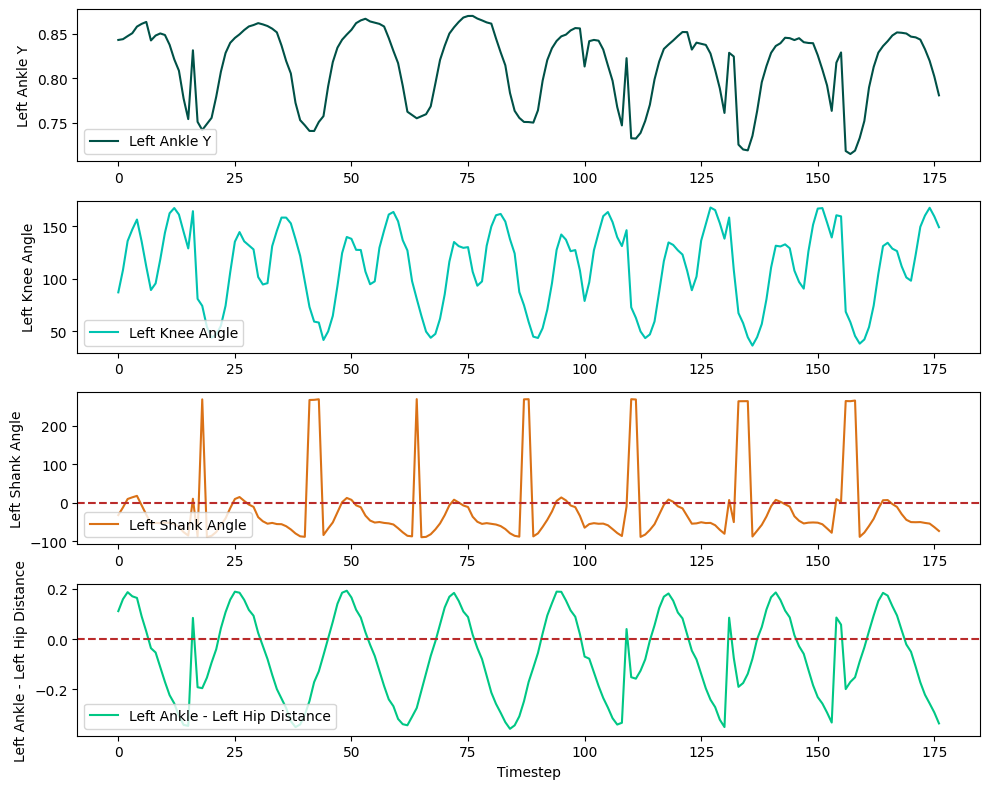

In [10]:
plot_running_data(overstride_1)

**Interpretation:**
<br> 
- The left leg of the runner in this video is at it's lowest point when 'left_ankle_y' is at its maximum of every cycle, this helps us identify a range of frames before and after where the runner's left leg is in contact with the ground.
- Everytime the left foot touches the ground, there is a huge decrease in the knee angle that follows over the next few frames. This shows that the runner's knee is likely overextended at point of contact and is trying to absorb the impact with his knee over the time where the left kfoot is in contact with the ground.
- The shank angle of the runner also becomes positive at every stride, in the next plot, we will aim to investigate if the shank angle is positive at point of contact
- Observing the ankle to hip distance, if the graph is positive, this shows that the ankle is in front of the hip. This will also be helpful for us to see if at point of contact, how far is the ankle in front of the hip.

In [11]:
# Look into a cycle at which the runner's left leg is in contact with the ground

overstride_1.loc[70:80]

,timestep,left_ankle_x,left_ankle_y,left_knee_x,left_knee_y,left_knee_angle,right_ankle_x,right_ankle_y,right_knee_x,right_knee_y,right_knee_angle,left_shank_angle,right_shank_angle,left_ankle_left_hip_distance
70,70,0.442919,0.836261,0.357721,0.702563,85.161553,0.844761,0.823030,0.695204,0.718532,166.582306,-32.506972,-55.057536,0.126303
71,71,0.394654,0.849994,0.377937,0.707798,116.193322,0.880186,0.808071,0.697018,0.718403,157.909011,-6.704832,-63.916207,0.168913
72,72,0.375147,0.857017,0.394987,0.712126,134.842740,0.897555,0.787980,0.674942,0.719411,143.444125,7.796950,-72.880259,0.184215
73,73,0.401527,0.863006,0.402914,0.718026,130.924628,0.883376,0.766209,0.648467,0.720364,132.641198,0.548018,-78.956982,0.152392
74,74,0.438426,0.867984,0.420377,0.724735,129.302787,0.821897,0.746387,0.563837,0.720856,96.794837,-7.181070,-84.349932,0.110019
75,75,0.460714,0.869729,0.434348,0.737637,129.958523,0.786840,0.740544,0.532397,0.725509,80.947942,-11.288310,-86.618264,0.088094
76,76,0.546549,0.869817,0.457298,0.749088,106.603238,0.722531,0.745562,0.503483,0.730407,68.832529,-36.474337,-86.042295,0.017671
77,77,0.617777,0.866847,0.483722,0.752718,93.381412,0.694196,0.752854,0.484963,0.728042,58.250444,-49.590316,-83.237261,-0.035258
78,78,0.683649,0.864784,0.533059,0.759693,97.445079,0.641778,0.752902,0.405307,0.712214,39.290853,-55.090343,-80.237127,-0.079171
79,79,0.742837,0.862517,0.606949,0.760506,131.242640,0.579287,0.775439,0.407839,0.704935,51.084832,-53.104730,-67.646326,-0.146698


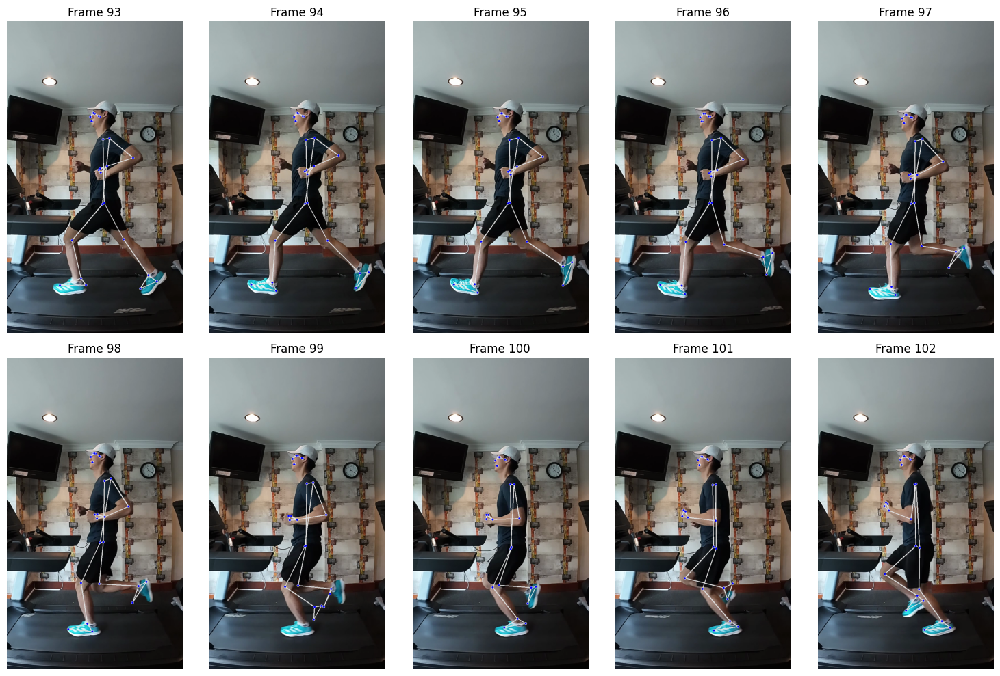

In [12]:
show_consecutive_frames(overstride_vid_1, 93, 10, pose)

**Initial Contact** <br>
We can observe for the above runner that he makes initial contact with the ground at frame 96. 

**Knee Angle:** <br>
As aligned with the above plot shows a quick contraction over the next few frames to absorbe the impact of landing. 

**Shank Angle, Ankle to Hip Distance:** <br>
The shank angle at Frame 96 is positive, showing that the ankle is ahead of the knee at point of contact.

**Zooming in:** <br>
As running movements and gait are habitual, we can look into just one stride cycle of each runner to analyse their feet position and angles over the cycle.

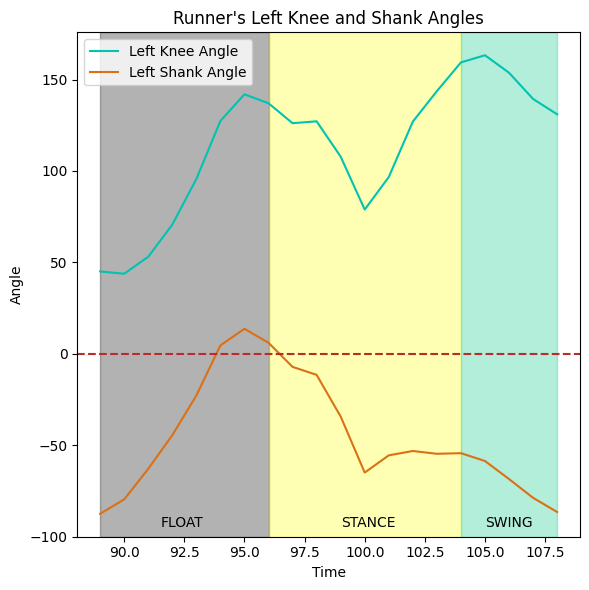

In [13]:
# Plotting the data
fig, ax1 = plt.subplots(figsize=(6, 6))  # Set the figure size

# Define custom color theme
colors = ['#bcbfbe', '#000000', '#ffffff', '#feff00', '#00c784', '#00c3b1', '#da7116', '#ba2b2b', '#005147']
# Grey, Black, White, Yellow, Dark Bluish, Bluish, Orange, Red, Forest Green

# Plotting 'left_knee_angle' and 'left_shank_angle' on the primary y-axis (ax1)
line1, = ax1.plot(overstride_1.loc[89:108]['left_knee_angle'], label='Left Knee Angle', color=colors[5])
line2, = ax1.plot(overstride_1.loc[89:108]['left_shank_angle'], label='Left Shank Angle', color=colors[-3])
ax1.set_xlabel('Time')
ax1.set_ylabel('Angle', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Add a horizontal line at 0 degrees
ax1.axhline(y=0, color=colors[-2], linestyle='--')

# Title and legend
plt.title("Runner's Left Knee and Shank Angles")
fig.tight_layout()

# Show the legend with combined handles and labels
plt.legend([line1, line2], ['Left Knee Angle', 'Left Shank Angle'], loc='upper left')

# Create colored boxes for the different sections
ax1.axvspan(89, 96, color=colors[1], alpha=0.3, label='Float')
ax1.axvspan(96, 104, color=colors[3], alpha=0.3, label='Stance')
ax1.axvspan(104, 108, color=colors[4], alpha=0.3, label='Swing')

# Add text annotations for the section labels
ax1.text(91.5, -95, 'FLOAT', fontsize=10, color='black')
ax1.text(99, -95, 'STANCE', fontsize=10, color='black')
ax1.text(105, -95, 'SWING', fontsize=10, color='black')

# Show the plot
plt.show()

**Interpretation:**

Zooming in on the runner's knee and shank angle, we can observe the following:
- At point of contact (Initial point of 'Stance' stage), the shank angle is positive, showing that the foot is in front of the knee and thus overstriding.
- The knee angle fluctuates over the next two frames, before quickly reducing to absorb the impact of landing. This lag in knee angle change could potentially spell knee injuries if this runner maintains such a stride over a long period of time.

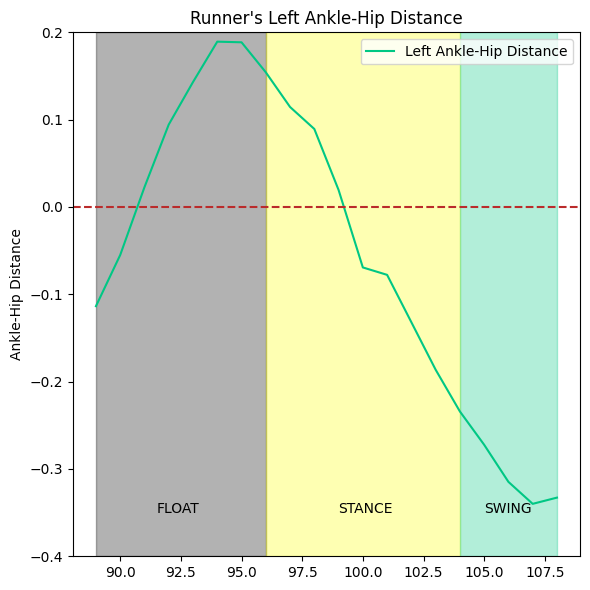

In [36]:
# Plotting the data
fig, ax2 = plt.subplots(figsize=(6, 6))  # Set the figure size

# Create a secondary y-axis (ax2) for 'left_ankle_left_hip_distance'
line2, = ax2.plot(overstride_1.loc[89:108]['left_ankle_left_hip_distance'], label='Left Ankle-Hip Distance', color=colors[4])
ax2.set_ylabel('Ankle-Hip Distance', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Set the y-axis limits for ax2
ax2.set_ylim(-0.4, 0.2)

# Set y=0 dotted line
ax2.axhline(y=0, color = colors[-2], linestyle='--')

# Title and legend
plt.title("Runner's Left Ankle-Hip Distance")
fig.tight_layout()

# Show the legend with combined handles and labels for both axes
plt.legend([line2], ['Left Ankle-Hip Distance'], loc='upper right')

# Create colored boxes for the different sections
ax2.axvspan(89, 96, color=colors[1], alpha=0.3, label='Float')
ax2.axvspan(96, 104, color=colors[3], alpha=0.3, label='Stance')
ax2.axvspan(104, 108, color=colors[4], alpha=0.3, label='Swing')

# Add text annotations for the section labels
ax2.text(91.5, -0.35, 'FLOAT', fontsize=10, color='black')
ax2.text(99, -0.35, 'STANCE', fontsize=10, color='black')
ax2.text(105, -0.35, 'SWING', fontsize=10, color='black')

# Show the plot
plt.show()

**Interpretation:**

Taking a closer look into the ankle to hip distance, we can also see that at the point of initial contact, the foot is furthest from the hip.

# 3.2 Proper Striding 1

In [15]:
good_form_1 = process_video('../datasets/good_running/M_running_4.mp4', pose)

[x: 0.3488094
y: 0.24796335
z: 0.009877457
visibility: 0.9997971
, x: 0.35211137
y: 0.24049702
z: -0.04823481
visibility: 0.99981594
, x: 0.35417217
y: 0.24034935
z: -0.04841695
visibility: 0.9998131
, x: 0.3569958
y: 0.24019276
z: -0.048491273
visibility: 0.9998515
, x: 0.34998405
y: 0.2413312
z: 0.013007138
visibility: 0.9997323
, x: 0.3518392
y: 0.2418531
z: 0.01305287
visibility: 0.99970376
, x: 0.35252908
y: 0.24223426
z: 0.013054653
visibility: 0.9997517
, x: 0.37774843
y: 0.24190591
z: -0.2123829
visibility: 0.99989206
, x: 0.375786
y: 0.24436058
z: 0.06955425
visibility: 0.9996646
, x: 0.36268508
y: 0.25171757
z: -0.043066844
visibility: 0.99988675
, x: 0.36142182
y: 0.2532955
z: 0.037238903
visibility: 0.9996691
, x: 0.42175126
y: 0.2871657
z: -0.3695607
visibility: 0.99995273
, x: 0.47265705
y: 0.28169897
z: 0.22462365
visibility: 0.99846935
, x: 0.41898528
y: 0.34291887
z: -0.29497
visibility: 0.99167055
, x: 0.5576096
y: 0.33016315
z: 0.46906692
visibility: 0.06986848
, x: 

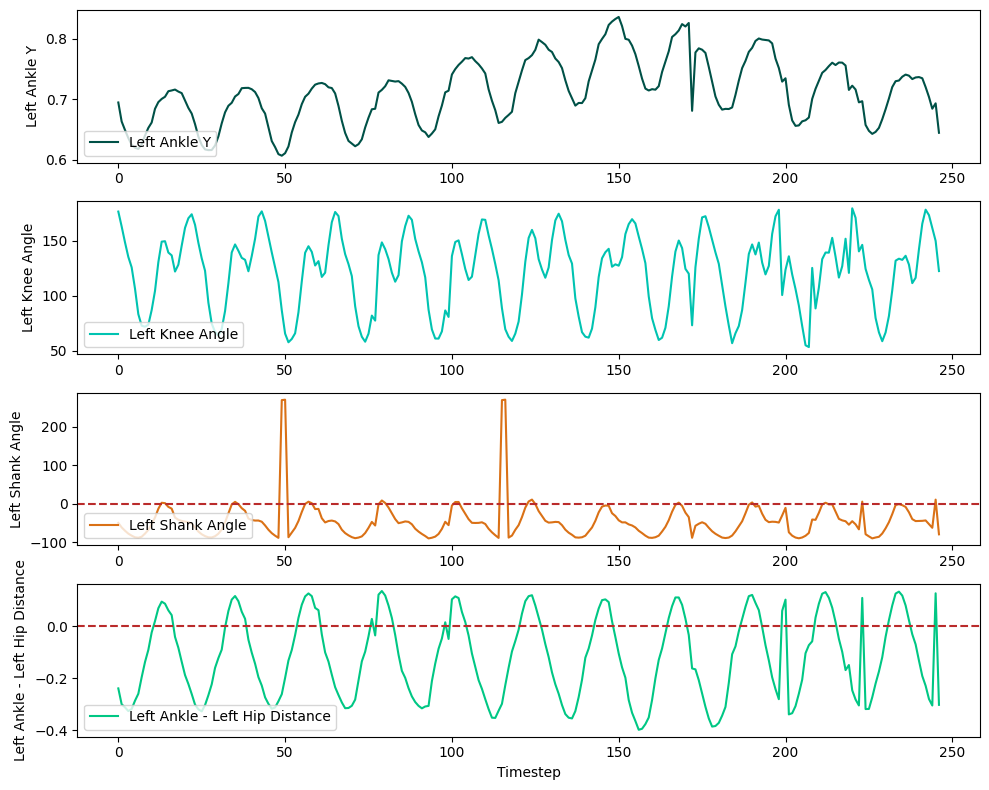

In [16]:
plot_running_data(good_form_1)

**Interpretation:**

1. Knee Angle: Similar to the overstriding runner, we can also observe a sharp decrease in knee angle at points where the runner's foot is in contact with the ground, however we can also observe that the knee reaction is much faster than the overstrider's (reduction in knee angle is almost instantaneous e.g. around frame 100-105)
2. Shank Angle: This runner's shank angle is rarely positive, showing that he always keeps his foot mostly under or behind his knee.
3. Left Ankle-Hip distance: The runner's ankle is also rarely too far forward. 

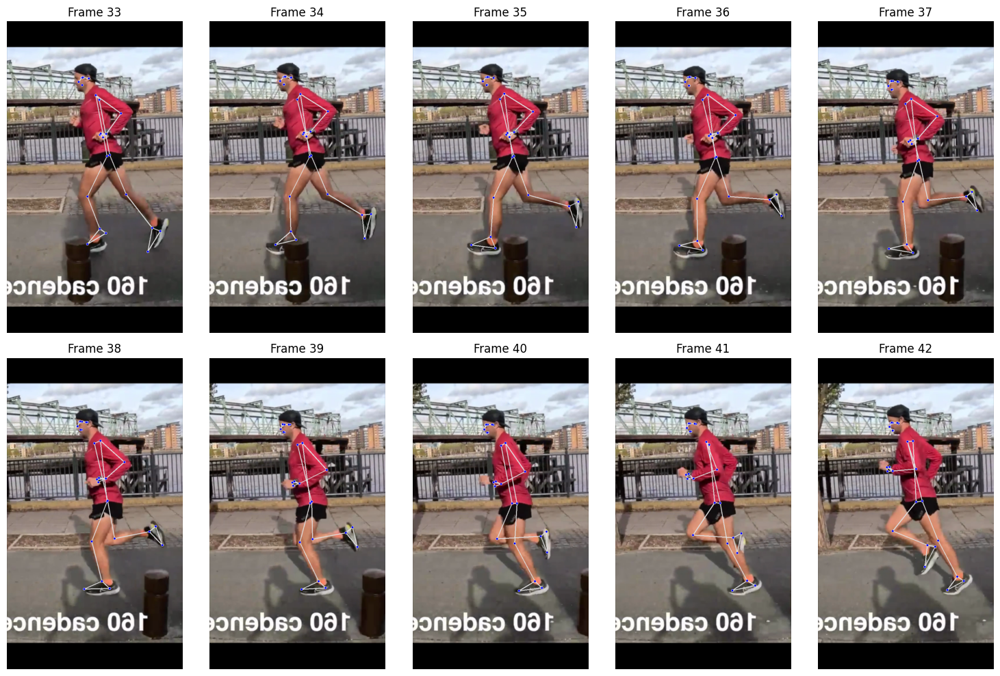

In [17]:
show_consecutive_frames('../datasets/good_running/M_Running_4.mp4', 33, 10, pose)

**Initial Contact** <br>
We can observe for the above runner that he makes initial contact with the ground at frame 36. 

**Knee Angle:** <br>
We can also observe that the knee angle has already been contracting before making contact with the ground. 

**Shank Angle, Ankle to Hip Distance:** <br>
Shank angle looks perpendicular as his foot makes contact with the ground, this angle immediately goes negative (foot behind knee) 

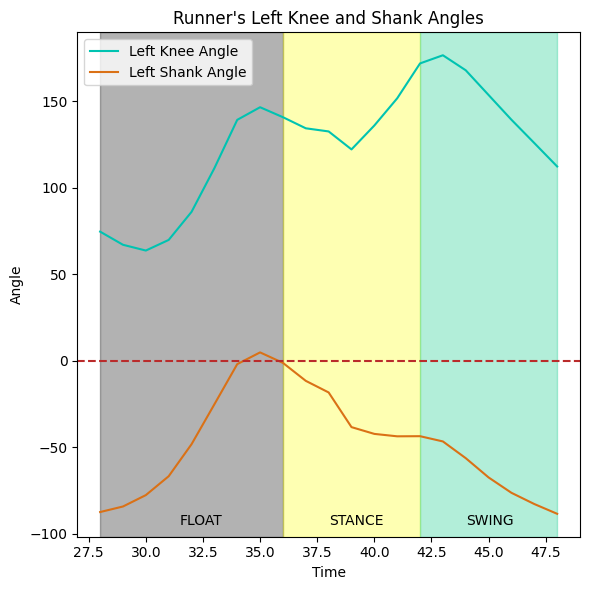

In [18]:
# Plotting the data
fig, ax1 = plt.subplots(figsize=(6, 6))  # Set the figure size

# Plotting 'left_knee_angle' and 'left_shank_angle' on the primary y-axis (ax1)
line1, = ax1.plot(good_form_1.loc[28:48]['left_knee_angle'], label='Left Knee Angle', color=colors[5])
line2, = ax1.plot(good_form_1.loc[28:48]['left_shank_angle'], label='Left Shank Angle', color=colors[-3])
ax1.set_xlabel('Time')
ax1.set_ylabel('Angle', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Add a horizontal line at 0 degrees
ax1.axhline(y=0, color=colors[-2], linestyle='--')

# Title and legend
plt.title("Runner's Left Knee and Shank Angles")
fig.tight_layout()

# Show the legend with combined handles and labels
plt.legend([line1, line2], ['Left Knee Angle', 'Left Shank Angle'], loc='upper left')

# Create colored boxes for the different sections
ax1.axvspan(28, 36, color=colors[1], alpha=0.3, label='Float')
ax1.axvspan(36, 42, color=colors[3], alpha=0.3, label='Stance')
ax1.axvspan(42, 48, color=colors[4], alpha=0.3, label='Swing')

# Add text annotations for the section labels
ax1.text(31.5, -95, 'FLOAT', fontsize=10, color='black')
ax1.text(38, -95, 'STANCE', fontsize=10, color='black')
ax1.text(44, -95, 'SWING', fontsize=10, color='black')

# Show the plot
plt.show()

**Interpretation:**
In comparison with the overstriding runner in section 3.1, we can observe that the shank angle only goes positive momentarily and quickly retracts to go negative (foot behind knee) again, before making contact with the ground. 

The knee angle reduces much quicker than the overstriding runner. Before making contact wiht the ground, this runner is already contracting his knee angleto brace for the impact at point of landing. This ensures a smooth knee angle reduction while being in contact with the ground as shown from time = 35-38 in. the above plot.

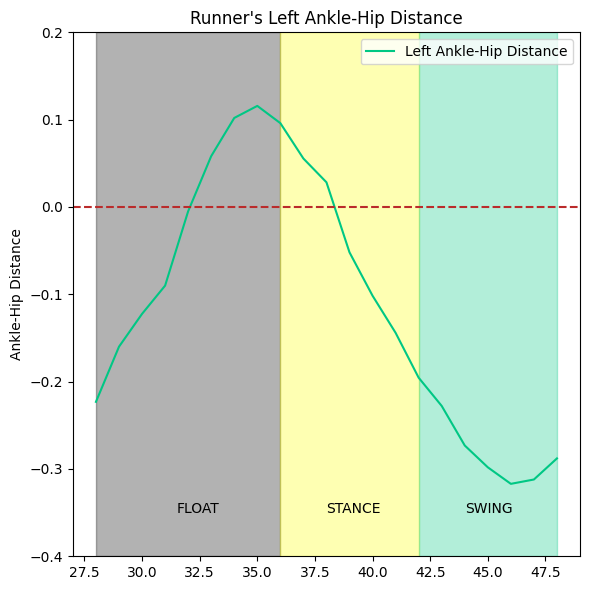

In [38]:
# Plotting the data
fig, ax2 = plt.subplots(figsize=(6, 6))  # Set the figure size

# Create a secondary y-axis (ax2) for 'left_ankle_left_hip_distance'
line2, = ax2.plot(good_form_1.loc[28:48]['left_ankle_left_hip_distance'], label='Left Ankle-Hip Distance', color=colors[4])
ax2.set_ylabel('Ankle-Hip Distance', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Set the y-axis limits for ax2
ax2.set_ylim(-0.4, 0.2)

# Set y=0 dotted line
ax2.axhline(y=0, color = colors[-2], linestyle='--')

# Title and legend
plt.title("Runner's Left Ankle-Hip Distance")
fig.tight_layout()

# Show the legend with combined handles and labels for both axes
plt.legend([line2], ['Left Ankle-Hip Distance'], loc='upper right')

# Create colored boxes for the different sections
ax2.axvspan(28, 36, color=colors[1], alpha=0.3, label='Float')
ax2.axvspan(36, 42, color=colors[3], alpha=0.3, label='Stance')
ax2.axvspan(42, 48, color=colors[4], alpha=0.3, label='Swing')

# Add text annotations for the section labels
ax2.text(31.5, -0.35, 'FLOAT', fontsize=10, color='black')
ax2.text(38, -0.35, 'STANCE', fontsize=10, color='black')
ax2.text(44, -0.35, 'SWING', fontsize=10, color='black')

# Show the plot
plt.show()

**Interpretation:**

As compared to the overstriding runner above, we can also observe that the ankle of this runner with proper form does not extend forward as much. While the shank angle only stays positive very slightly before recovering to a negative position.

### 3.2.1 Comparing Both Runners Shank Angle

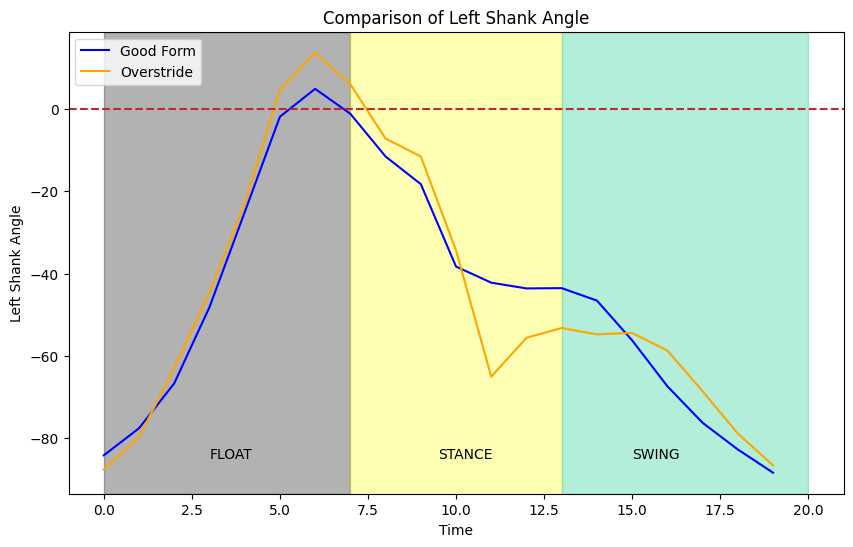

In [20]:
# Reset index for both dataframes
good_form_1_reset = good_form_1.loc[29:48].reset_index(drop=True)
overstride_1_reset = overstride_1.loc[89:108].reset_index(drop=True)

# Plotting the data with a unified time axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot 'left_shank_angle' from good_form_1_reset dataframe
ax.plot(good_form_1_reset.index, good_form_1_reset['left_shank_angle'], label='Good Form', color='blue')

# Plot 'left_shank_angle' from overstride_1_reset dataframe
ax.plot(overstride_1_reset.index, overstride_1_reset['left_shank_angle'], label='Overstride', color='orange')

# Set y=0 line
ax.axhline(y=0, color=colors[-2], linestyle='--')

# Add labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Left Shank Angle')
ax.set_title("Comparison of Left Shank Angle")

# Add legend
ax.legend(loc = 'upper left')

# Create colored boxes for the different sections
ax.axvspan(0, 7, color=colors[1], alpha=0.3, label='Float')
ax.axvspan(7, 13, color=colors[3], alpha=0.3, label='Stance')
ax.axvspan(13, 20, color=colors[4], alpha=0.3, label='Swing')

# Add text annotations for the section labels
ax.text(3, -85, 'FLOAT', fontsize=10, color='black')
ax.text(9.5, -85, 'STANCE', fontsize=10, color='black')
ax.text(15, -85, 'SWING', fontsize=10, color='black')

# Show the plot
plt.show()

**Interpretation:**
In the split seconds before landing, the overstriding runner has his foot more extended beyond the knee than the non-overstriding runner, at more than twice the shank angle. This poses more difficulty for the overstriding runner to recover his shank angle to a neutral position (directly under the knee) during landing. 

### 3.2.2 Comparing Both Runners Knee Angle

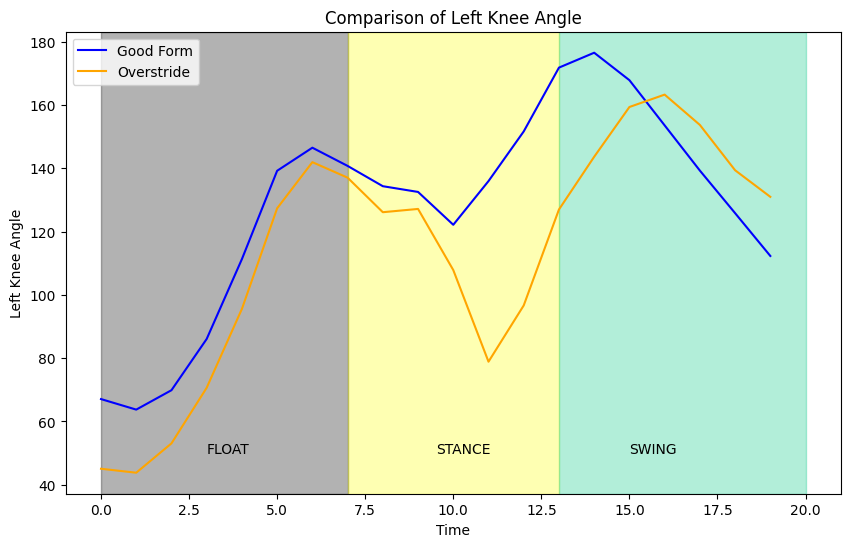

In [21]:
# Plotting the data with a unified time axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot 'left_knee_angle' from good_form_1_reset dataframe
ax.plot(good_form_1_reset.index, good_form_1_reset['left_knee_angle'], label='Good Form', color='blue')

# Plot 'left_knee_angle' from overstride_1_reset dataframe
ax.plot(overstride_1_reset.index, overstride_1_reset['left_knee_angle'], label='Overstride', color='orange')

# Add labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Left Knee Angle')
ax.set_title("Comparison of Left Knee Angle")

# Add legend
ax.legend(loc = 'upper left')

# Create colored boxes for the different sections
ax.axvspan(0, 7, color=colors[1], alpha=0.3, label='Float')
ax.axvspan(7, 13, color=colors[3], alpha=0.3, label='Stance')
ax.axvspan(13, 20, color=colors[4], alpha=0.3, label='Swing')

# Add text annotations for the section labels
ax.text(3, 50, 'FLOAT', fontsize=10, color='black')
ax.text(9.5, 50, 'STANCE', fontsize=10, color='black')
ax.text(15, 50, 'SWING', fontsize=10, color='black')

# Show the plot
plt.show()

**Interpretation:**
1. The overstriding runner has a generally smaller knee angle over the stride cycle than the other runner. This could be a matter of habit, as the runner often has to brace his knees for impact.
2. The knee angle of the overstriding runner at the stance position has a large contraction (around frames 9 to 11) as compared to the runner who is not overstriding, this shows that the overstriding runner's knee has more impact to absorb post landing and also to regenerate a force to transition into the 'Swing' section.

### 3.2.3 Comparison Both Runners Ankle-Hip Distance

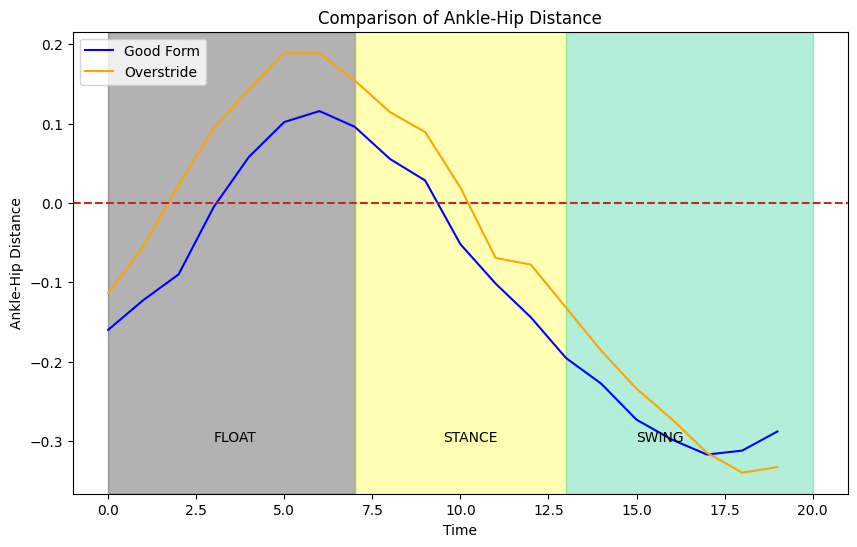

In [22]:
# Plotting the data with a unified time axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot 'left_ankle_left_hip_distance' from good_form_1_reset dataframe
ax.plot(good_form_1_reset.index, good_form_1_reset['left_ankle_left_hip_distance'], label='Good Form', color='blue')

# Plot 'left_ankle_left_hip_distance' from overstride_1_reset dataframe
ax.plot(overstride_1_reset.index, overstride_1_reset['left_ankle_left_hip_distance'], label='Overstride', color='orange')

# Add labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Ankle-Hip Distance')
ax.set_title("Comparison of Ankle-Hip Distance")

# Set y=0 line
ax.axhline(y=0, color=colors[-2], linestyle='--')

# Add legend
ax.legend(loc = 'upper left')

# Create colored boxes for the different sections
ax.axvspan(0, 7, color=colors[1], alpha=0.3, label='Float')
ax.axvspan(7, 13, color=colors[3], alpha=0.3, label='Stance')
ax.axvspan(13, 20, color=colors[4], alpha=0.3, label='Swing')

# Add text annotations for the section labels
ax.text(3, -0.3, 'FLOAT', fontsize=10, color='black')
ax.text(9.5, -0.3, 'STANCE', fontsize=10, color='black')
ax.text(15, -0.3, 'SWING', fontsize=10, color='black')

# Show the plot
plt.show()

**Interpretation:**
In the above plot, we notice that the overstriding runner has a generally more positive ankle to hip distance. This means that at any point of the stride cycle, the overstriding runner has his foot more forward than the other runner. This poses a stronger likelihood of the overstriding runner to overstride at point of landing as it will take more effort for the runner to recover his foot position into a neutral landing position.

# 3.3 Overstride 2

In [23]:
overstride_vid_2 = '../datasets/bad_running/Overstride_8.mp4'

overstride_2 = process_video(overstride_vid_2, pose)

[x: 0.37886208
y: 0.35131595
z: 0.10194796
visibility: 0.99982214
, x: 0.39313355
y: 0.3378619
z: 0.061390612
visibility: 0.9998345
, x: 0.39719364
y: 0.33733645
z: 0.061390024
visibility: 0.9998252
, x: 0.40150544
y: 0.33691487
z: 0.06134374
visibility: 0.999872
, x: 0.39101732
y: 0.33767116
z: 0.111900955
visibility: 0.99978596
, x: 0.39322415
y: 0.33707783
z: 0.111913405
visibility: 0.9997646
, x: 0.39564735
y: 0.3365312
z: 0.11186009
visibility: 0.999822
, x: 0.42686358
y: 0.34181592
z: -0.041289657
visibility: 0.9998861
, x: 0.4226317
y: 0.34174496
z: 0.18429089
visibility: 0.99970573
, x: 0.3923072
y: 0.3638174
z: 0.07284853
visibility: 0.9998439
, x: 0.38921952
y: 0.3635735
z: 0.13758498
visibility: 0.99961966
, x: 0.43212566
y: 0.40633202
z: -0.16597459
visibility: 0.99993783
, x: 0.49478164
y: 0.40794575
z: 0.33170232
visibility: 0.99873865
, x: 0.38258958
y: 0.50806916
z: -0.09337895
visibility: 0.9886142
, x: 0.6335241
y: 0.4789788
z: 0.42556703
visibility: 0.12325887
, x: 0

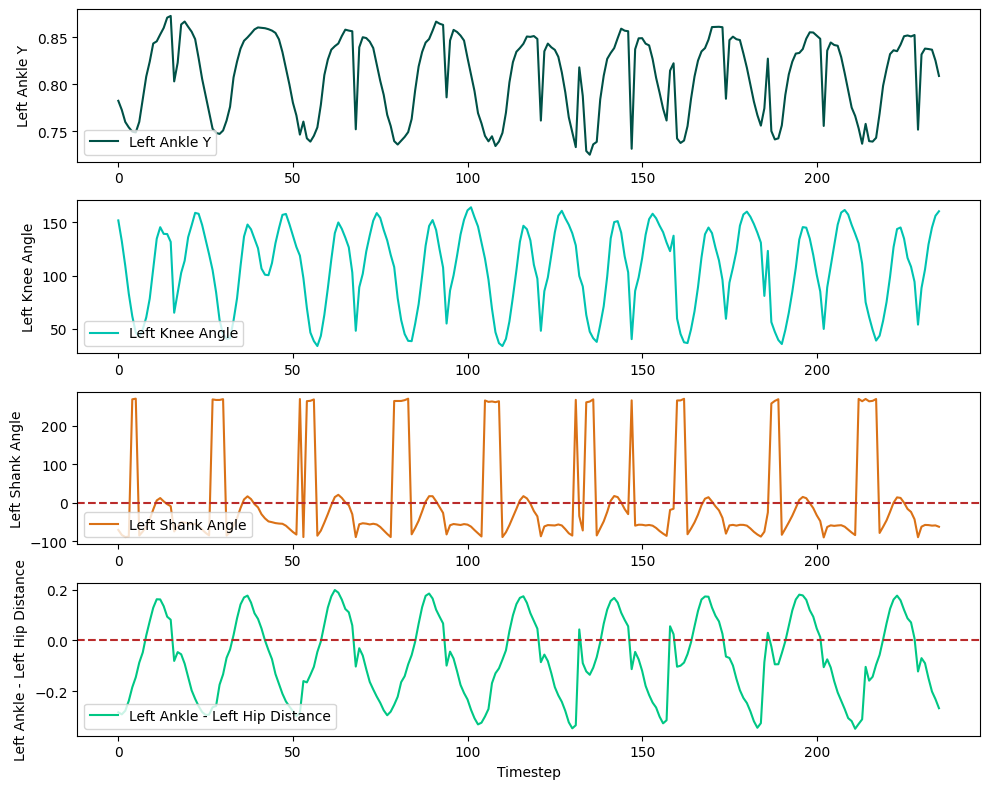

In [24]:
plot_running_data(overstride_2)

**Interpretation:**
Ignoring the noise in the data, we can focus into 1 cycle moment of the left foot across frames 30-50. 

1. Knee Angle: The Knee angle does not have a lag in reaction, suggesting a smooth reduction in knee angle at point of contact.
2. Shank Angle: The Shank Angle goes positive quite significantly, we wil investigate in the next few lines to see if this corresponds ot the point of contact.
3. Ankle to Hip Distance: This runner extends his foot forward quite drastically as compared to other runners.

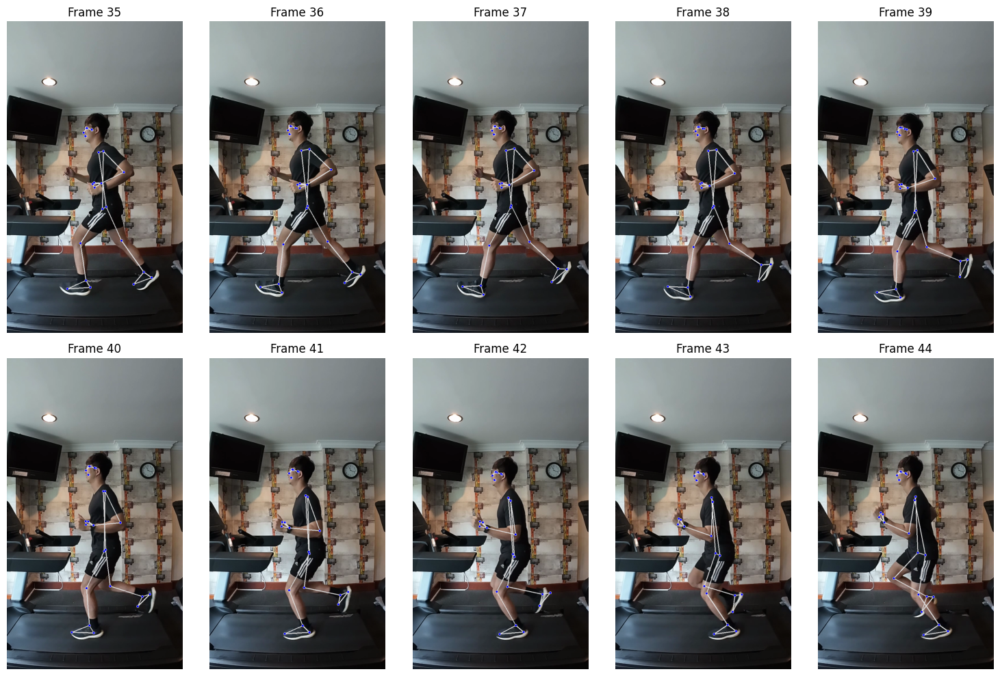

In [25]:
show_consecutive_frames(overstride_vid_2, 35, 10, pose)

**Interpretation:**

Runner's foot makes contact with the ground at frame 38, where shank angle looks positive as his foot is in front of his knee. We will observe this in the next plot.

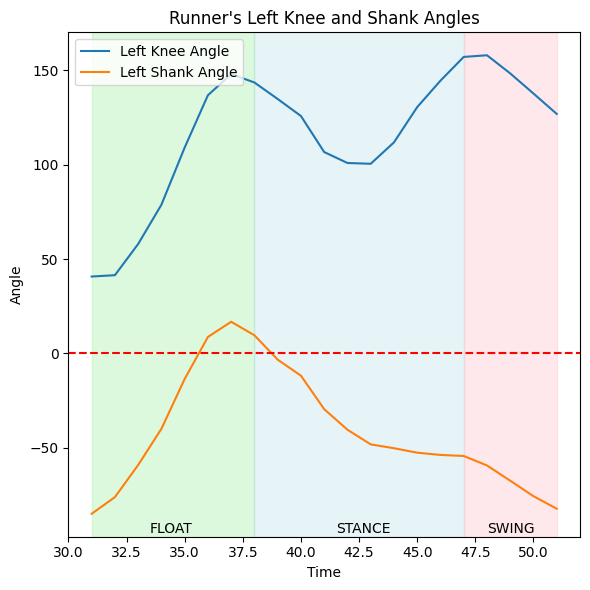

In [26]:
# Plotting the data
fig, ax1 = plt.subplots(figsize=(6, 6))  # Set the figure size

# Plotting 'left_knee_angle' and 'left_shank_angle' on the primary y-axis (ax1)
line1, = ax1.plot(overstride_2.loc[31:51]['left_knee_angle'], label='Left Knee Angle', color='tab:blue')
line2, = ax1.plot(overstride_2.loc[31:51]['left_shank_angle'], label='Left Shank Angle', color='tab:orange')
ax1.set_xlabel('Time')
ax1.set_ylabel('Angle', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Add a horizontal line at 0 degrees
ax1.axhline(y=0, color='red', linestyle='--')

# Title and legend
plt.title("Runner's Left Knee and Shank Angles")
fig.tight_layout()

# Show the legend with combined handles and labels
plt.legend([line1, line2], ['Left Knee Angle', 'Left Shank Angle'], loc='upper left')

# Create colored boxes for the different sections
ax1.axvspan(31, 38, color='lightgreen', alpha=0.3, label='Float')
ax1.axvspan(38, 47, color='lightblue', alpha=0.3, label='Stance')
ax1.axvspan(47, 51, color='lightpink', alpha=0.3, label='Swing')

# Add text annotations for the section labels
ax1.text(33.5, -95, 'FLOAT', fontsize=10, color='black')
ax1.text(41.5, -95, 'STANCE', fontsize=10, color='black')
ax1.text(48, -95, 'SWING', fontsize=10, color='black')

# Show the plot
plt.show()

**Interpretation:**
- Looking at the shank angle, we can see that it is positive at point of contact. We also observe that overstriding happens only momentarily, as the first overstriding video also lands with his foot in front of his knee and within the next frame, recovers to a neutral shank angle position. 
- While this runner may be overstriding, there seems to be less impact on his knee angle as the knee angle smoothly reduces into the foot landing.

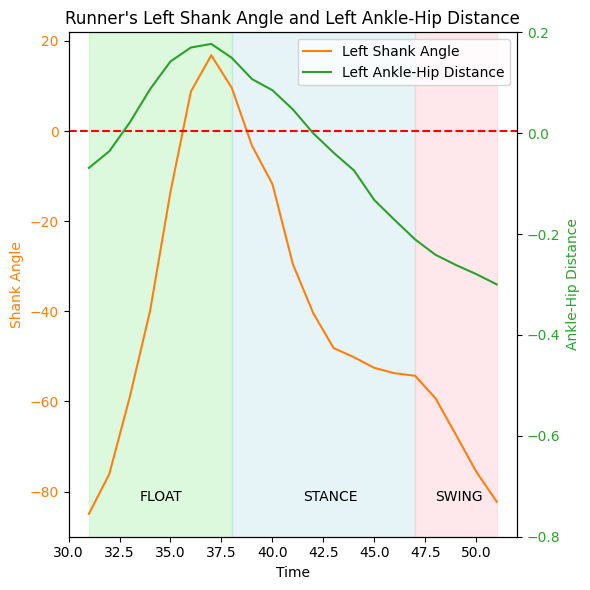

In [27]:
# Plotting the data
fig, ax1 = plt.subplots(figsize=(6, 6))  # Set the figure size

# Plotting 'left_knee_angle' and 'left_shank_angle' on the primary y-axis (ax1)
line1, = ax1.plot(overstride_2.loc[31:51]['left_shank_angle'], label='Left Shank Angle', color='tab:orange')
ax1.set_xlabel('Time')
ax1.set_ylabel('Shank Angle', color='tab:orange')
ax1.tick_params(axis='y', labelcolor='tab:orange')

# Create a secondary y-axis (ax2) for 'left_ankle_left_hip_distance'
ax2 = ax1.twinx()
line2, = ax2.plot(overstride_2.loc[31:51]['left_ankle_left_hip_distance'], label='Left Ankle-Hip Distance', color='tab:green')
ax2.set_ylabel('Ankle-Hip Distance', color='tab:green')
ax2.tick_params(axis='y', labelcolor='tab:green')

# Set the y-axis limits for ax2
ax2.set_ylim(-0.8, 0.2)

# Add a horizontal line at 0 degrees on ax1
ax1.axhline(y=0, color='red', linestyle='--')

# Title and legend
plt.title("Runner's Left Shank Angle and Left Ankle-Hip Distance")
fig.tight_layout()

# Show the legend with combined handles and labels for both axes
plt.legend([line1, line2], ['Left Shank Angle', 'Left Ankle-Hip Distance'], loc='upper right')

# Create colored boxes for the different sections
ax1.axvspan(31, 38, color='lightgreen', alpha=0.3, label='Float')
ax1.axvspan(38, 47, color='lightblue', alpha=0.3, label='Stance')
ax1.axvspan(47, 51, color='lightpink', alpha=0.3, label='Swing')

# Add text annotations for the section labels
ax1.text(33.5, -82, 'FLOAT', fontsize=10, color='black')
ax1.text(41.5, -82, 'STANCE', fontsize=10, color='black')
ax1.text(48, -82, 'SWING', fontsize=10, color='black')

# Show the plot
plt.show()

**Interpretation:**

The runner's foot stays far extended beyond the hip for almost half the time while the runner's foot is in the 'stance' position. This suggests that even while the shank angle may be negative, the runner's foot is still far extended beyond the body. 

# 3.4 Proper Striding 2

In [28]:
good_form_vid_2 = '../datasets/good_running/M_Running_6.mp4'
good_form_2 = process_video(good_form_vid_2, pose)

[x: 0.5107373
y: 0.30659908
z: 0.494407
visibility: 0.99716413
, x: 0.51794213
y: 0.3004381
z: 0.44991142
visibility: 0.9946762
, x: 0.5174194
y: 0.3001614
z: 0.44970378
visibility: 0.9927465
, x: 0.51702195
y: 0.2999303
z: 0.44975713
visibility: 0.9950237
, x: 0.52109164
y: 0.30112788
z: 0.48323712
visibility: 0.9961281
, x: 0.5229566
y: 0.30116707
z: 0.48334584
visibility: 0.9946105
, x: 0.5250631
y: 0.30117607
z: 0.48323947
visibility: 0.996769
, x: 0.5185199
y: 0.30272073
z: 0.33374423
visibility: 0.9963158
, x: 0.52564853
y: 0.30324653
z: 0.48318145
visibility: 0.99646
, x: 0.481299
y: 0.302932
z: 0.45979062
visibility: 0.9976897
, x: 0.50756735
y: 0.31385034
z: 0.5015299
visibility: 0.9972359
, x: 0.49752983
y: 0.32990345
z: 0.05242622
visibility: 0.9998891
, x: 0.55343777
y: 0.34369633
z: 0.54745054
visibility: 0.9994158
, x: 0.42484128
y: 0.31847164
z: -0.25379083
visibility: 0.98303676
, x: 0.6918646
y: 0.3211923
z: 0.36283866
visibility: 0.16078424
, x: 0.36083195
y: 0.308657

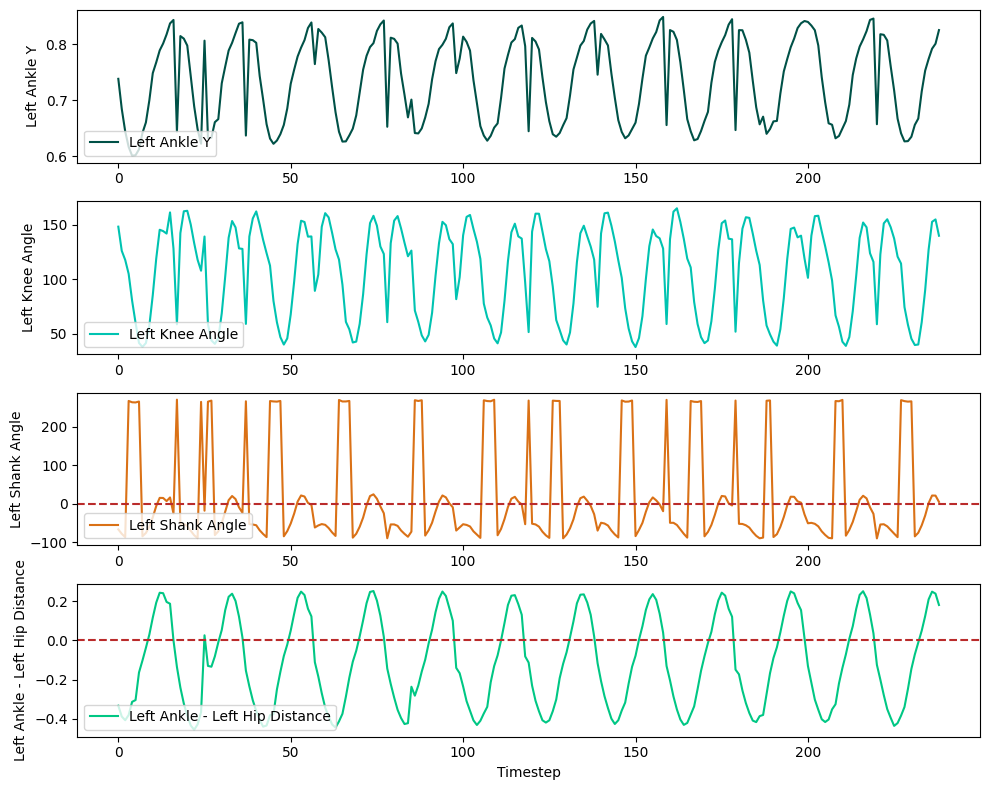

In [29]:
plot_running_data(good_form_2)

**Interpretation:**
- Ignoring the noise, we can focus on frames 90-110 to observe the runner's data:
- Knee angle has a quick reduction and increase, showing a more explosive contact with the ground.
- Shank angle goes positive quite often (ignoring those values that extended beyond 200).
- Ankle to hip distance has larger magnitude on the negatives than positives. This shows that the leg extends backwards more than it goes forward.

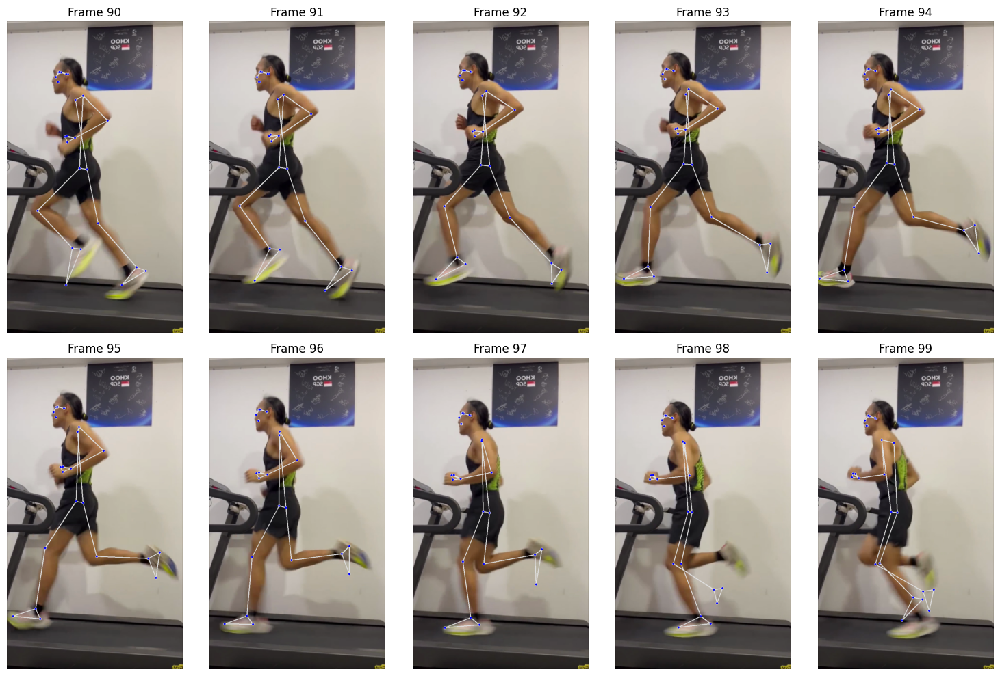

In [30]:
show_consecutive_frames(good_form_vid_2, 90, 10, pose)

**Interpretation:**
- The runner landed at frame 97 on his left foot.

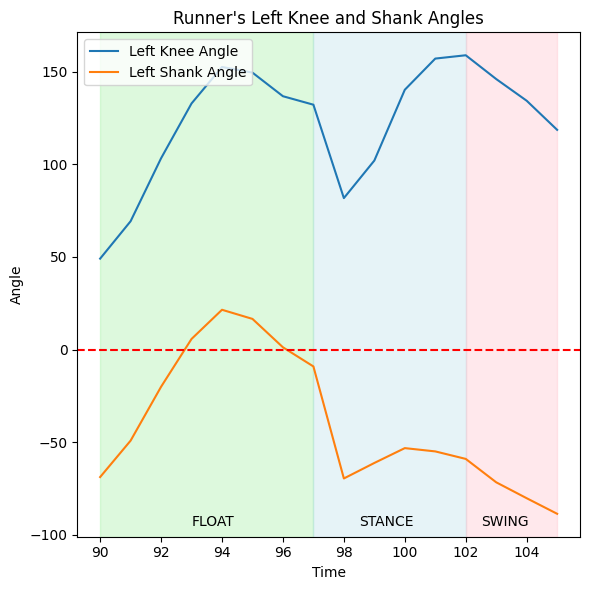

In [31]:
# Plotting the data
fig, ax1 = plt.subplots(figsize=(6, 6))  # Set the figure size

# Plotting 'left_knee_angle' and 'left_shank_angle' on the primary y-axis (ax1)
line1, = ax1.plot(good_form_2.loc[90:105]['left_knee_angle'], label='Left Knee Angle', color='tab:blue')
line2, = ax1.plot(good_form_2.loc[90:105]['left_shank_angle'], label='Left Shank Angle', color='tab:orange')
ax1.set_xlabel('Time')
ax1.set_ylabel('Angle', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Add a horizontal line at 0 degrees
ax1.axhline(y=0, color='red', linestyle='--')

# Title and legend
plt.title("Runner's Left Knee and Shank Angles")
fig.tight_layout()

# Show the legend with combined handles and labels
plt.legend([line1, line2], ['Left Knee Angle', 'Left Shank Angle'], loc='upper left')

# Create colored boxes for the different sections
ax1.axvspan(90, 97, color='lightgreen', alpha=0.3, label='Float')
ax1.axvspan(97, 102, color='lightblue', alpha=0.3, label='Stance')
ax1.axvspan(102, 105, color='lightpink', alpha=0.3, label='Swing')

# Add text annotations for the section labels
ax1.text(93, -95, 'FLOAT', fontsize=10, color='black')
ax1.text(98.5, -95, 'STANCE', fontsize=10, color='black')
ax1.text(102.5, -95, 'SWING', fontsize=10, color='black')

# Show the plot
plt.show()

**Interpretation:**
We can observe that the runner's shank angle is negative (Ankle behind knee) at point of contact.
The runner's knee also braces for impact before point of accontact, with the knee angle contracting before even making contact with the ground. 

We can also see that the runner makes full use of his knees to have an explosive motion when it is in contact with the ground, as the angle quickly increases within 1 to 2 frames to straighten up again into the swing. 

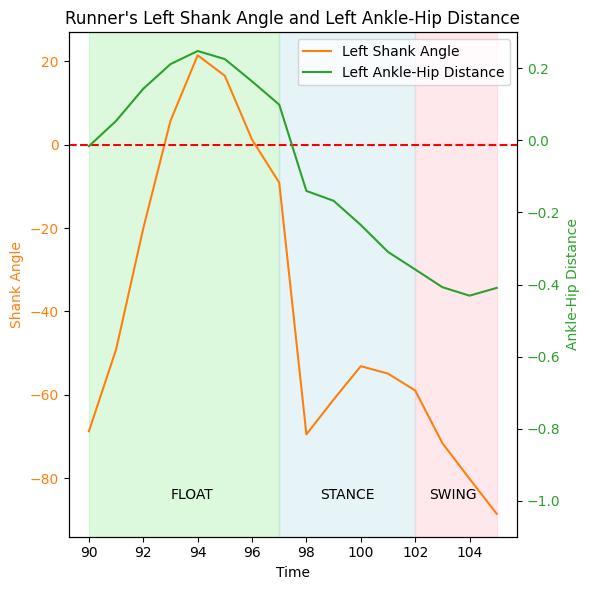

In [32]:
# Plotting the data
fig, ax1 = plt.subplots(figsize=(6, 6))  # Set the figure size

# Plotting 'left_knee_angle' and 'left_shank_angle' on the primary y-axis (ax1)
line1, = ax1.plot(good_form_2.loc[90:105]['left_shank_angle'], label='Left Shank Angle', color='tab:orange')
ax1.set_xlabel('Time')
ax1.set_ylabel('Shank Angle', color='tab:orange')
ax1.tick_params(axis='y', labelcolor='tab:orange')

# Create a secondary y-axis (ax2) for 'left_ankle_left_hip_distance'
ax2 = ax1.twinx()
line2, = ax2.plot(good_form_2.loc[90:105]['left_ankle_left_hip_distance'], label='Left Ankle-Hip Distance', color='tab:green')
ax2.set_ylabel('Ankle-Hip Distance', color='tab:green')
ax2.tick_params(axis='y', labelcolor='tab:green')

# Set the y-axis limits for ax2
ax2.set_ylim(-1.1, 0.3)

# Add a horizontal line at 0 degrees on ax1
ax1.axhline(y=0, color='red', linestyle='--')

# Title and legend
plt.title("Runner's Left Shank Angle and Left Ankle-Hip Distance")
fig.tight_layout()

# Show the legend with combined handles and labels for both axes
plt.legend([line1, line2], ['Left Shank Angle', 'Left Ankle-Hip Distance'], loc='upper right')

# Create colored boxes for the different sections
ax1.axvspan(90, 97, color='lightgreen', alpha=0.3, label='Float')
ax1.axvspan(97, 102, color='lightblue', alpha=0.3, label='Stance')
ax1.axvspan(102, 105, color='lightpink', alpha=0.3, label='Swing')

# Add text annotations for the section labels
ax1.text(93, -85, 'FLOAT', fontsize=10, color='black')
ax1.text(98.5, -85, 'STANCE', fontsize=10, color='black')
ax1.text(102.5, -85, 'SWING', fontsize=10, color='black')

# Show the plot
plt.show()

**Interpretation:**
We can observe in the above plot that the runner's left ankle is only momentarily in front of the hip, before he moves to a neutral or negative position through the foot's contact with the ground

# 4. Conclusion

1. Not all overstriding happens the same way, however there are some methods to help us observe if the foot is landing far extended from the body's center of mass. In this case, we're using the hip as a measure of center. 

2. Overstriding happens very instantaneously as it is unnatural for most people, our bodies adjust very quickly to ensure that our feet are in the right running position when in contact with the ground.

3. However many micro injuries across a long period of time can cause larger problems in the future, thus correcting overstriding is especially important for recreational runners.

---
In the next notebook, we will perform and finetune a classification model to classify a runner's gait, specifically if they are overstriding or not. 